# Opening the file and get a dataframe

In [1]:
import requests

# Function to download a file from google drive
def download_file_from_google_drive(id, destination):
    URL = "https://docs.google.com/uc?export=download"

    session = requests.Session()

    response = session.get(URL, params = { 'id' : id }, stream = True)
    token = get_confirm_token(response)

    if token:
        params = { 'id' : id, 'confirm' : token }
        response = session.get(URL, params = params, stream = True)

    save_response_content(response, destination)    

def get_confirm_token(response):
    for key, value in response.cookies.items():
        if key.startswith('download_warning'):
            return value

    return None

def save_response_content(response, destination):
    CHUNK_SIZE = 32768

    with open(destination, "wb") as f:
        for chunk in response.iter_content(CHUNK_SIZE):
            if chunk: # filter out keep-alive new chunks
                f.write(chunk)

In [2]:
import pandas as pd
import os

def get_dataframe(id, destination, csv_sep=';'):
    
    download_file_from_google_drive(id, destination)
    df =  pd.read_csv("./tmp_file.csv", sep=csv_sep)
    os.remove("tmp_file.csv")
    
    return df

In [3]:
wine_df = get_dataframe("1-oG5-kBt9xQ3Li4PEexpiA9_7RZhRM1f", "./tmp_file.csv")

In [4]:
print(wine_df.type.unique())

['White' 'Red']


In [5]:
wine_df_white = wine_df[wine_df.type == 'White']
wine_df_red = wine_df[wine_df.type == 'Red']

In [6]:
print(wine_df_red.count().max(),wine_df_white.count().max(), wine_df.count().max())

1599 4898 6497


# Start of exploration analysis

OBS.: Os vinhos tem caracteristicas muito diferentes se vermelhos, brancos ou espumantes e mesmo dentro de cada uma dessas categorias o tipo da uva tem muita influência ao se julgar o que é um  vinho de qualidade dentro daquela divisão.
Aqui, só temos info se é vermelho ou branco e separaremo, ao menos, nesse aspecto.

A analise é a mesma (mesmos passos) para cada data set faremos uma exploratória de ambos mas seguiremos apenas com um.

In [7]:
wine_df_white =  wine_df_white.drop(labels=['type'], axis=1)

In [8]:
wine_df_white.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                  object
quality                   int64
dtype: object

In [9]:
wine_df_white['alcohol'] = pd.to_numeric(wine_df_white.alcohol,errors='coerse').dropna()

In [10]:
wine_df_white.dropna(inplace=True)

In [11]:
print(wine_df_white.count().max())

4864


In [12]:
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sns

## Pearson - Mostaria a correlação entre duas variaveis se ela é linear

In [13]:
seed = 23111990
random_state = np.random.RandomState(seed=seed)

In [14]:
wine_df_red.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,2.208702,3.311113,0.658149,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,9.664060,0.154386,0.169507,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,100.369000,4.010000,2.000000,8.000000


In [15]:
wine_df_white.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4864.000000,4864.000000,4864.000000,4864.000000,4864.000000,4864.000000,4864.000000,4864.000000,4864.000000,4864.000000,4864.000000,4864.000000
mean,6.859200,0.278181,0.334396,6.398355,0.045791,35.283717,138.386822,1.552249,3.188255,0.489613,10.510929,5.877056
std,0.843096,0.100874,0.121153,5.079978,0.021903,17.023142,42.542545,6.862246,0.151101,0.113993,1.231607,0.886585
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991740,3.087500,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993800,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996120,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,103.898000,3.820000,1.080000,14.200000,9.000000


In [16]:
print("\nRed:\n", wine_df_red.corr(method='pearson')['quality'],"\n\n\nWhite:\n", wine_df_white.corr(method='pearson')['quality'])


Red:
 fixed acidity           0.124052
volatile acidity       -0.390558
citric acid             0.226373
residual sugar          0.013732
chlorides              -0.128907
free sulfur dioxide    -0.050656
total sulfur dioxide   -0.185100
density                -0.025891
pH                     -0.057731
sulphates               0.251397
quality                 1.000000
Name: quality, dtype: float64 


White:
 fixed acidity          -0.114925
volatile acidity       -0.195655
citric acid            -0.010245
residual sugar         -0.099181
chlorides              -0.209434
free sulfur dioxide     0.007932
total sulfur dioxide   -0.174003
density                -0.025689
pH                      0.101304
sulphates               0.052717
alcohol                 0.435758
quality                 1.000000
Name: quality, dtype: float64


## Spearman - Mostra a correlação entre duas variaveis mas não necessariamente linear, as duas variaveis sofrem mudancas juntas mas não necessáriamente ela é constante

In [17]:
print("\nRed:\n", wine_df_red.corr(method='spearman')['quality'],"\n\n\nWhite:\n", wine_df_white.corr(method='spearman')['quality'])


Red:
 fixed acidity           0.114084
volatile acidity       -0.380647
citric acid             0.213481
residual sugar          0.032048
chlorides              -0.189922
free sulfur dioxide    -0.056901
total sulfur dioxide   -0.196735
density                -0.177007
pH                     -0.043672
sulphates               0.377060
quality                 1.000000
Name: quality, dtype: float64 


White:
 fixed acidity          -0.085035
volatile acidity       -0.198022
citric acid             0.016739
residual sugar         -0.084329
chlorides              -0.314187
free sulfur dioxide     0.023411
total sulfur dioxide   -0.195719
density                -0.349066
pH                      0.111728
sulphates               0.031841
alcohol                 0.440198
quality                 1.000000
Name: quality, dtype: float64


#### Como  esperado  os parametros que tem correlacao sao diferentes nos vinhos brancos e vermelhos.
## Vou seguir com os vinhos brancos, poderia ser o  vermelho, os passos não seriam muito  diferentes. Não entendo  que nesse teste o objetivo seja de  fato o modelo e sim como chegar e avaliar ele, comento  sobre  o outro set de dados no final. (se der tempo faço ele também)

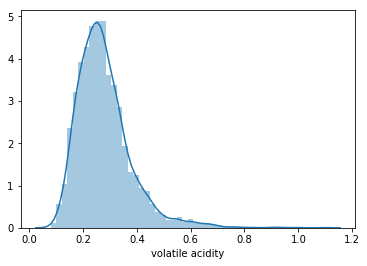

In [18]:
sns.distplot(wine_df_white['volatile acidity'])
plt.show()

In [19]:
wine_df_white = wine_df_white[wine_df_white.density < 10]
print(wine_df_white.count().max())

4793


- Havia vinhos com densidade superior a 10 (densidade de metais pesados), tirei eles do grupo de analise por não conseguir corrigir o valor da medida com o correto, dado as informacoes disponiveis

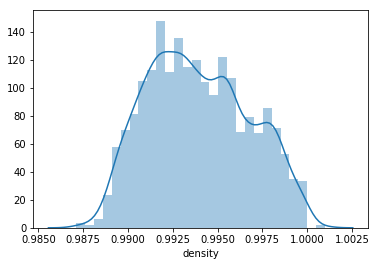

In [20]:
sns.distplot(wine_df_white['density'])
plt.show()

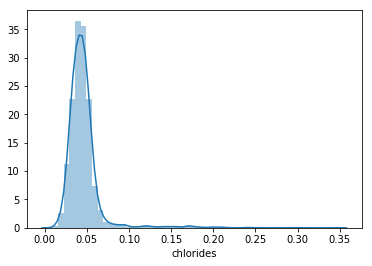

In [21]:
sns.distplot(wine_df_white['chlorides'])
plt.show()

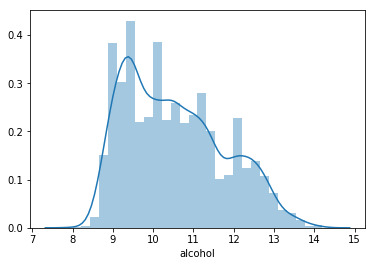

In [22]:
sns.distplot(wine_df_white['alcohol'])
plt.show()

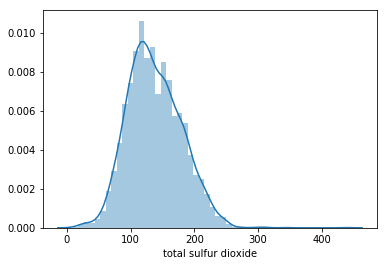

In [23]:
sns.distplot(wine_df_white['total sulfur dioxide'])
plt.show()

#### Salvo densidade que a distribuicao ja parece razoavel, transformar os outros valores pode ajduar, veremos:

In [24]:
x_axis =  wine_df_white.drop(labels=['quality'], axis=1)

In [25]:
from scipy.stats import skew

In [26]:
skews = dict(zip(x_axis.columns, skew(x_axis)))
skews = pd.DataFrame(data={
        'feature': list(skews.keys()),
        'skewness': list(skews.values()),
    })

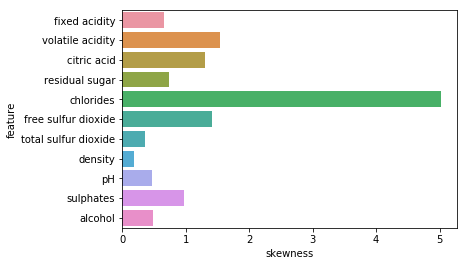

In [27]:
sns.barplot(y='feature', x='skewness', data=skews)
plt.show()

In [28]:
percentiles = np.percentile(skews['skewness'], [2,5,10,15,80])
print(percentiles)

[0.22442759 0.27609068 0.36219582 0.41161465 1.4149923 ]


In [29]:
features_to_transform = skews[skews['skewness'] > percentiles[2]]['feature']
print(features_to_transform)

0           fixed acidity
1        volatile acidity
2             citric acid
3          residual sugar
4               chlorides
5     free sulfur dioxide
8                      pH
9               sulphates
10                alcohol
Name: feature, dtype: object


In [30]:
x_axis_old = x_axis

In [31]:
x_axis.min()

fixed acidity           3.80000
volatile acidity        0.08000
citric acid             0.00000
residual sugar          0.60000
chlorides               0.00900
free sulfur dioxide     2.00000
total sulfur dioxide    9.00000
density                 0.98711
pH                      2.72000
sulphates               0.22000
alcohol                 8.00000
dtype: float64

#### Como tem 0 no acido citrico iremos somar uma constante para poder transformar

In [32]:
for feature in features_to_transform:
    if feature == 'citric acid':
        x_axis[feature] += 1
    x_axis[feature] = np.log(x_axis[feature])

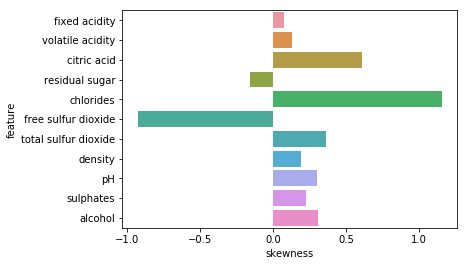

In [33]:
skews = dict(zip(x_axis.columns, skew(x_axis)))
skews = pd.DataFrame(data={
        'feature': list(skews.keys()),
        'skewness': list(skews.values()),
    })
sns.barplot(y='feature', x='skewness', data=skews)
plt.show()

## Detect outliers

##### Comecei com um  tresh de 3 mas isso fazia com que 12 % da amostra fosse perdida, voltei par ao indicado 3.5 para o método MAD

In [34]:
def mad_based_outlier(points, thresh=3.5):
    if len(points.shape) == 1:
        points = points[:,None]
    median = np.median(points, axis=0)
    diff = np.sum((points - median)**2, axis=-1)
    diff = np.sqrt(diff)
    med_abs_deviation = np.median(diff)

    modified_z_score = 0.6745 * diff / med_abs_deviation

    return modified_z_score > thresh

In [35]:
for column in list(x_axis.columns):
    print(column,':',x_axis[mad_based_outlier(x_axis[column])].count().max())

fixed acidity : 15
volatile acidity : 12
citric acid : 146
residual sugar : 0
chlorides : 129
free sulfur dioxide : 48
total sulfur dioxide : 6
density : 0
pH : 13
sulphates : 13
alcohol : 0


In [36]:
index_to_drop = []

In [37]:
for column in list(x_axis.columns):
    index_to_drop.append(list(x_axis[mad_based_outlier(x_axis[column])].index))

In [38]:
index_to_drop = list(np.unique(np.concatenate(index_to_drop)).astype(int))

In [39]:
print("Percent lost:",len(index_to_drop) / x_axis.count().max())

Percent lost: 0.0736490715626956


In [40]:
index_to_keep = []

In [41]:
for i in list(x_axis.index):
    if i not in index_to_drop:
        index_to_keep.append(i)

In [42]:
print(len(index_to_drop),len(index_to_keep),len(x_axis))

353 4440 4793


In [43]:
assert len(index_to_drop) + len(index_to_keep) == len(x_axis)

In [44]:
x_axis_no_out = x_axis.loc[index_to_keep]

In [45]:
y_axis = wine_df_white['quality']

In [46]:
y_axis_no_out = y_axis.loc[index_to_keep]

In [47]:
assert len(y_axis_no_out) == len(x_axis_no_out)

In [48]:
df_shaped = pd.concat((x_axis_no_out, y_axis_no_out.to_frame()), axis=1)

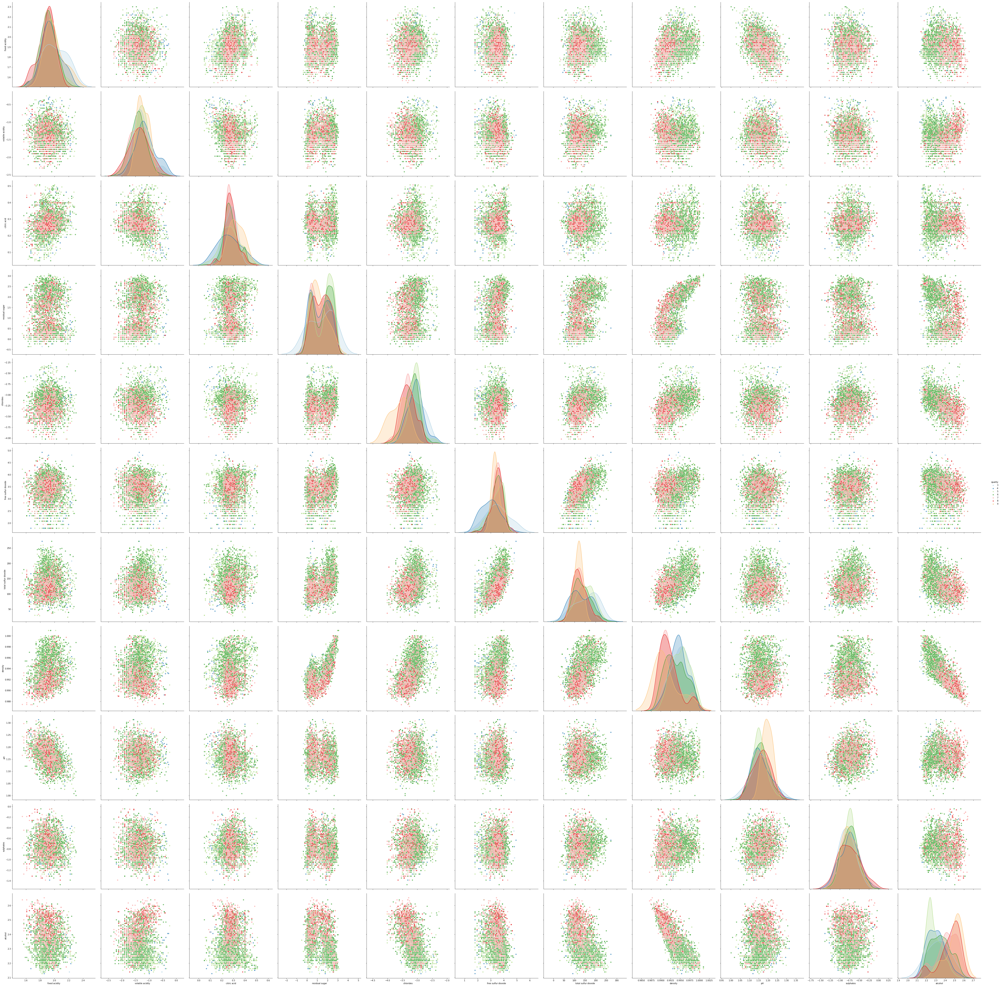

In [49]:
sns.pairplot(df_shaped, vars = df_shaped.columns[:11], hue='quality', diag_kind='kde',
             palette=sns.color_palette("Paired"), plot_kws={'marker': 'o', 'alpha': 0.7},height=6)
plt.show()

#### Do que vimos da correlacao ,  relembrando:
- volatile acidity       -0.198022
- chlorides              -0.314187
- total sulfur dioxide   -0.195719
- density                -0.349066
- alcohol                 0.440198

# Last check

Os dados estão balanceados?

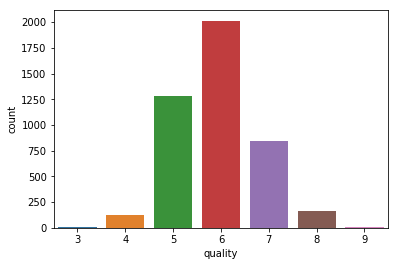

In [50]:
sns.countplot(y_axis_no_out)
plt.show()

Os dados não só não estão balanceados como a amostra não dá para ser reduzida. Temos um número muito baixo de exemmplos para (3 e 4) e para (8 e 9)

Vamos separar a amostra e fazer o upsample para  o que usaremos no  modelo

In [51]:
from sklearn.model_selection import StratifiedKFold

In [52]:
skf = StratifiedKFold(n_splits=4, shuffle=True, random_state=random_state) # 4 splits por causa  das divisoes que teremos ao filtrar as  colunas

In [53]:
skf_split = skf.split(np.zeros(len(x_axis_no_out)), y_axis_no_out)

In [54]:
for train_inds, valid_inds in skf_split:
    print(train_inds.shape, valid_inds.shape)

(3327,) (1113,)
(3329,) (1111,)
(3332,) (1108,)
(3332,) (1108,)


In [55]:
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler

In [56]:
sm = SMOTE(random_state=random_state)
ros = RandomOverSampler(random_state=random_state)

(14098, 11) (14098,)


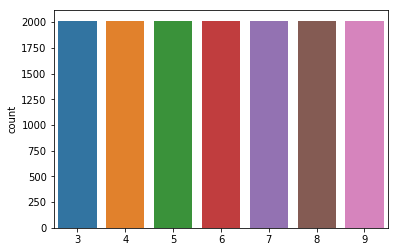

In [57]:
x_axis_ups, y_axis_ups = ros.fit_sample(x_axis_no_out, y_axis_no_out)
print(x_axis_ups.shape, y_axis_ups.shape)
sns.countplot(y_axis_ups)
plt.show()

## Analise de reducao das dimensoes

In [58]:
from sklearn.preprocessing import StandardScaler

- Aqui deixei apenas as colunas que tem correlacao  com o que queremos para seguir, fica a  cargo de  quem  está lendo comentar a linha que filtra e rodar novamente com todas para ver o que ocorre. (spoiler: o algoritmo se confunde e piora em muito a eficiência)

In [59]:
# x_axis_std_sc = StandardScaler().fit_transform(x_axis_no_out) #Descomentar aqui e comentar abaixo caso queira todas as colunas

In [60]:
x_axis_std_sc = StandardScaler().fit_transform(x_axis_no_out[[
                                                                'volatile acidity',
                                                                'chlorides',
                                                                'total sulfur dioxide',
                                                                'density',
                                                                'alcohol'
                                                            ]])

In [61]:
# x_axis_std_sc
# x_axis_no_out
# Ver de  dropar eixos desnecessarios

In [62]:
from sklearn.manifold import TSNE

In [63]:
tSNE = TSNE(n_components=2, random_state=random_state)
x_axis_tSNE = tSNE.fit_transform(x_axis_std_sc)

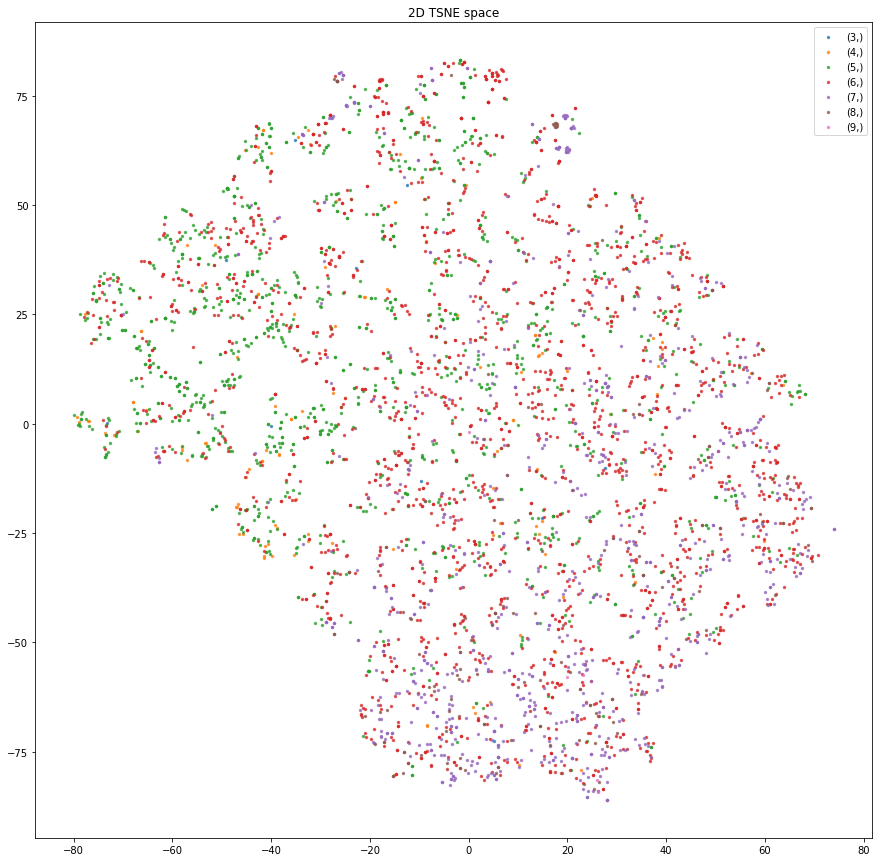

In [64]:
plt.figure(figsize=(15,15))
for item in zip(np.unique(y_axis_no_out.values)):
    plt.scatter(x_axis_tSNE[y_axis_no_out.values == item, 0], 
                x_axis_tSNE[y_axis_no_out.values == item, 1],
                s=2, lw=2,
                label=item, alpha=0.75)
plt.title('2D TSNE space')
plt.legend(loc='best', scatterpoints=1)
plt.show()

###### Ao que parece sera dificil  fazer a classificacao, ha grupos visiveis na amostra mas tambem ha algumas notas que estao  quase que uniformemente espalhadas no  nosso  grafico

#  Split data set

In [65]:
train_fraction = 0.8
test_fraction = 1 - train_fraction

In [66]:
train_len = int(len(x_axis_no_out) * train_fraction)
test_len = len(x_axis_no_out) - train_len
train_len, test_len

(3552, 888)

In [67]:
from sklearn.model_selection import StratifiedShuffleSplit

In [68]:
shuflle_split = StratifiedShuffleSplit(n_splits=1, random_state=random_state, test_size=test_fraction)

In [69]:
for train_inds, test_inds in shuflle_split.split(np.zeros(len(x_axis_tSNE)), y_axis_no_out):
    train_indices = train_inds
    test_indices = test_inds

In [70]:
x_axis_train = x_axis_tSNE[train_indices]
x_axis_test = x_axis_tSNE[test_indices]
# x_axis_train
# x_axis_test

In [71]:
y_axis_train = y_axis_no_out.iloc[train_indices].values.astype(np.int)
y_axis_test = y_axis_no_out.iloc[test_indices].values.astype(np.int)
# y_axis_train
# y_axis_test

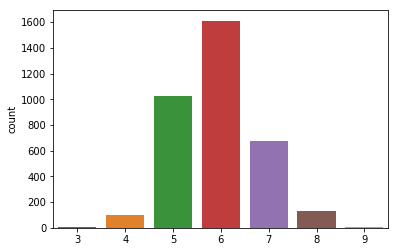

In [72]:
sns.countplot(y_axis_train)

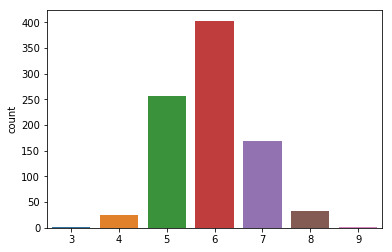

In [73]:
sns.countplot(y_axis_test)

## Dummy class as baseline

In [74]:
from sklearn.dummy import DummyClassifier

In [75]:
from sklearn.metrics import f1_score

In [76]:
def score_classifier(y_true, y_pred):
    return f1_score(
        y_true, y_pred,
        average='micro'
    )

In [77]:
def dummy_classify():
    dc = DummyClassifier(random_state=random_state, strategy='stratified')
    dc.fit(x_axis_train, y_axis_train)
    #return dc.score(XX_train, yy_train), dc.score(XX_test, yy_test)
    preds = dc.predict(x_axis_test)
    return score_classifier(y_axis_test, preds)

In [78]:
dc_scores = [dummy_classify() for i in range(50000)]

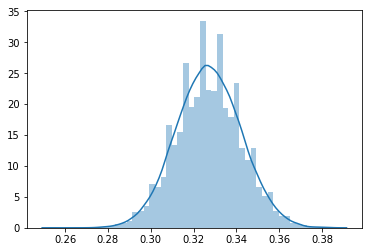

In [79]:
sns.distplot(dc_scores)
plt.show()

In [80]:
np.percentile(dc_scores, [2.5, 50, 97.5])

array([0.2972973 , 0.32657658, 0.35698198])

In [81]:
dummy_classifier_best_score = 0.36

# Start the classifier

In [82]:
from sklearn.neighbors import KNeighborsClassifier

In [83]:
from skopt import gp_minimize
from skopt.space import Integer

In [84]:
count = 0

In [85]:
def upsample(inputs, targets):
    return ros.fit_sample(inputs, targets)

In [86]:
def cross_validate(estimator, inputs=x_axis_train, targets=y_axis_train, upsampling=True):
    
    indices_iterator = skf.split(np.zeros(len(inputs)),targets)
    
    scores = []    
    for train_inds, valid_inds in indices_iterator:
        cur_x_train = inputs[train_inds]
        cur_y_train = targets[train_inds]
        if upsampling:
            cur_x_train, cur_y_train = upsample(cur_x_train, cur_y_train)
        
        #keep valid inds intact
        cur_x_valid = inputs[valid_inds]
        cur_y_valid = targets[valid_inds]
        
        estimator.fit(cur_x_train, cur_y_train)
        cur_preds = estimator.predict(cur_x_valid)
        
        cur_score = score_classifier(y_true = cur_y_valid, y_pred=cur_preds)
        scores.append(cur_score)
        
    return np.mean(scores)

In [87]:
def objective(params):
    n_neighbors = params[0]
    
    global count
    count += 1
    print("{}) cur params: {}".format(count, params))
    
    estimator = KNeighborsClassifier(n_neighbors=n_neighbors)
    
    average_score = cross_validate(estimator, upsampling=True)
    
    return -average_score

In [88]:
res_gp = gp_minimize(
    func=objective, 
    dimensions= [Integer(low=1, high=100)], 
    n_calls=50,
    random_state=random_state,
    n_random_starts=50
)

1) cur params: [24]
2) cur params: [78]
3) cur params: [13]
4) cur params: [43]
5) cur params: [32]
6) cur params: [85]
7) cur params: [45]
8) cur params: [69]
9) cur params: [94]
10) cur params: [98]
11) cur params: [92]
12) cur params: [10]
13) cur params: [32]
14) cur params: [84]
15) cur params: [8]
16) cur params: [5]
17) cur params: [14]
18) cur params: [27]
19) cur params: [74]
20) cur params: [39]
21) cur params: [53]
22) cur params: [76]
23) cur params: [68]
24) cur params: [30]
25) cur params: [39]
26) cur params: [90]
27) cur params: [78]
28) cur params: [23]
29) cur params: [36]
30) cur params: [95]
31) cur params: [10]
32) cur params: [75]
33) cur params: [54]
34) cur params: [12]
35) cur params: [58]
36) cur params: [68]
37) cur params: [14]
38) cur params: [60]
39) cur params: [14]
40) cur params: [76]
41) cur params: [40]
42) cur params: [92]
43) cur params: [49]
44) cur params: [39]
45) cur params: [6]
46) cur params: [39]
47) cur params: [19]
48) cur params: [37]
49) 

In [89]:
from skopt.plots import plot_convergence

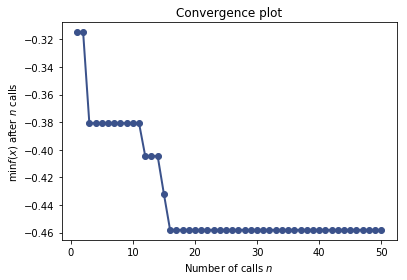

In [90]:
plot_convergence(res_gp)
plt.grid()
plt.show()

In [91]:
best_n_neighbors = res_gp.x[0]
# res_gp.x[0]

In [92]:
x_axis_train_final, y_axis_train_final = upsample(x_axis_train, y_axis_train)
# x_axis_train_final.shape

In [93]:
model = KNeighborsClassifier(n_neighbors=best_n_neighbors).fit(x_axis_train_final, y_axis_train_final)

In [94]:
preds = model.predict(x_axis_test)

## Vemos que o score aqui esta bem melhor que o dummy classifier

In [95]:
score_classifier(y_true=y_axis_test, y_pred=preds)

0.48085585585585583

In [96]:
from sklearn.metrics import confusion_matrix
import itertools

###### Funcao tirada do proprio ex do sklearn
https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html#sphx-glr-auto-examples-model-selection-plot-confusion-matrix-py

In [97]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

In [98]:
class_names = list(np.unique(y_axis_ups))

Confusion matrix, without normalization
[[  0   0   1   1   0   0   0]
 [  0  10   8   4   2   1   0]
 [  1  24 145  61  24   1   0]
 [  7  28 101 159  80  24   4]
 [  2   5  16  33  98  12   2]
 [  0   1   2   7   8  15   0]
 [  0   0   0   0   0   1   0]]
Normalized confusion matrix
[[0.   0.   0.5  0.5  0.   0.   0.  ]
 [0.   0.4  0.32 0.16 0.08 0.04 0.  ]
 [0.   0.09 0.57 0.24 0.09 0.   0.  ]
 [0.02 0.07 0.25 0.39 0.2  0.06 0.01]
 [0.01 0.03 0.1  0.2  0.58 0.07 0.01]
 [0.   0.03 0.06 0.21 0.24 0.45 0.  ]
 [0.   0.   0.   0.   0.   1.   0.  ]]


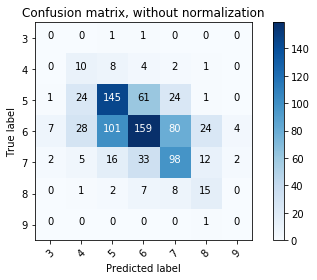

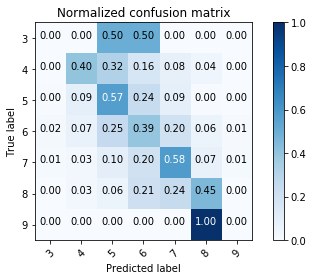

In [99]:
cnf_matrix = confusion_matrix(y_axis_test, preds)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()